## Build MRCNN Model
Pass data through MRCNN and then FCN and investigte output values from FCN
- First we generate the heatmaps, and also visually cehck them. 
- the we pass the heatmaps to the routine that prodcues the scores 

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
%matplotlib inline
%load_ext autoreload
%autoreload 2
import sys, os, random, pprint
sys.path.append('../../')
import tensorflow          as tf
import keras.backend       as KB
import numpy               as np
import matplotlib as plt
from mrcnn.datagen         import data_generator, load_image_gt, data_gen_simulate
from mrcnn.callbacks       import get_layer_output_1,get_layer_output_2
from mrcnn.utils           import mask_string, parse_image_meta, apply_box_deltas_tf, log, Paths, command_line_parser
from mrcnn.visualize       import display_gt_bboxes, display_roi_proposals, plot_3d_heatmap 
from mrcnn.visualize       import display_gt_bboxes, display_roi_proposals
from mrcnn.prep_notebook   import mrcnn_coco_train, prep_coco_dataset
from mrcnn.coco            import CocoDataset, CocoConfig, CocoInferenceConfig, evaluate_coco, build_coco_results
import mrcnn.visualize     as visualize
from mrcnn.visualize       import (plot_one_bbox_heatmap, 
                             plot_3d_heatmap, plot_2d_heatmap, 
                             plot_2d_heatmap_compare, plot_3d_heatmap_compare)
import mrcnn.model_fcn     as fcn_modellib
# import mrcnn.model_mrcnn   as mrcnn_modellib
import mrcnn.utils         as utils
# from mrcnn.utils        import log, stack_tensors, stack_tensors_3d, write_stdout
# from mrcnn.datagen      import data_generator, load_image_gt, data_gen_simulate
# from mrcnn.datagen_fcn  import fcn_data_gen_simulate
# from mrcnn.callbacks    import get_layer_output_1,get_layer_output_2
# from mrcnn.coco         import CocoDataset, CocoInferenceConfig, evaluate_coco, build_coco_results
# from mrcnn.coco         import CocoConfig
# from mrcnn.heatmap      import HeatmapDataset
from mrcnn.prep_notebook import prep_heatmap_dataset, prep_coco_dataset
pp = pprint.PrettyPrinter(indent=2, width=100)
np.set_printoptions(linewidth=100,precision=4,threshold=1000, suppress = True)

####  Pass input parameters to argparse

# args = parser.parse_args("--epochs 100 --steps_in_epoch 128  --last_epoch 1264 --batch_size 8  --lr 0.5               --logs_dir train_fcn_adagrad --model /home/kbardool/models/train_mrcnn/shapes20180621T1554/mask_rcnn_shapes_1119.h5 --fcn_model init".split())
# input_parms = "--epochs 100 --steps_in_epoch 100  --last_epoch 1264 --batch_size 25 --lr 0.8 --val_steps 5 --logs_dir train_fcn_adagrad --model /home/kbardool/models/train_mrcnn/shapes20180621T1554/mask_rcnn_shapes_1119.h5 --fcn_model /home/kbardool/models/train_fcn_adagrad/shapes20180709T1732/fcn_shapes_1167.h5"
# input_parms +=" --model     /home/kbardool/models/train_mrcnn/shapes20180621T1554/mask_rcnn_shapes_1119.h5 "
##------------------------------------------------------------------------------------
## Parse command line arguments
##------------------------------------------------------------------------------------
parser = command_line_parser()
input_parms = "--epochs 2 --steps_in_epoch 32  --last_epoch 0 --batch_size 2 --lr 0.00001 --val_steps 8 " 
# input_parms +="--mrcnn_logs_dir train_mrcnn_newshapes "
# input_parms +="--fcn_logs_dir   train_fcn8_newshapes "
input_parms +="--mrcnn_logs_dir train_mrcnn_coco "
input_parms +="--fcn_logs_dir   train_fcn8_coco_adam "
input_parms +="--mrcnn_model    last "
input_parms +="--fcn_model      init "
input_parms +="--opt            adagrad "
input_parms +="--fcn_arch       fcn8 " 
input_parms +="--fcn_layers     all " 
input_parms +="--sysout        screen "
input_parms +="--new_log_folder    "
# input_parms +="--fcn_model /home/kbardool/models/train_fcn_adagrad/shapes20180709T1732/fcn_shapes_1167.h5"
print(input_parms)

args = parser.parse_args(input_parms.split())
# args = parser.parse_args()

##----------------------------------------------------------------------------------------------
## if debug is true set stdout destination to stringIO
##----------------------------------------------------------------------------------------------            
# debug = False
if args.sysout == 'FILE':
    sys.stdout = io.StringIO()

# print("    Dataset            : ", args.dataset)
# print("    Logs               : ", args.logs)
# print("    Limit              : ", args.limit)
print("    MRCNN Model        : ", args.mrcnn_model)
print("    FCN Model          : ", args.fcn_model)
print("    MRCNN Log Dir      : ", args.mrcnn_logs_dir)
print("    FCN Log Dir        : ", args.fcn_logs_dir)
print("    FCN Arch           : ", args.fcn_arch)
print("    FCN Log Dir        : ", args.fcn_layers)
print("    Last Epoch         : ", args.last_epoch)
print("    Epochs to run      : ", args.epochs)
print("    Steps in each epoch: ", args.steps_in_epoch)
print("    Validation steps   : ", args.val_steps)
print("    Batch Size         : ", args.batch_size)
print("    Optimizer          : ", args.opt)
print("    sysout             : ", args.sysout)
# print("    OS Platform        : ", syst)

##------------------------------------------------------------------------------------
## setup project directories
##   ROOT_DIR         : Root directory of the project 
##   MODEL_DIR        : Directory to save logs and trained model
##   COCO_MODEL_PATH  : Path to COCO trained weights
##---------------------------------------------------------------------------------
paths = Paths(fcn_training_folder = args.fcn_logs_dir, mrcnn_training_folder = args.mrcnn_logs_dir)
paths.display()

### Build Configuration Object
### Build Configuration Object

##------------------------------------------------------------------------------------
## Build configuration object 
##------------------------------------------------------------------------------------                          
mrcnn_config                    = CocoConfig()
# import mrcnn.new_shapes as new_shapes
# mrcnn_config = new_shapes.NewShapesConfig()

mrcnn_config.NAME               = 'mrcnn'              
mrcnn_config.TRAINING_PATH      = paths.MRCNN_TRAINING_PATH
mrcnn_config.COCO_DATASET_PATH  = paths.COCO_DATASET_PATH 
mrcnn_config.COCO_MODEL_PATH    = paths.COCO_MODEL_PATH   
mrcnn_config.RESNET_MODEL_PATH  = paths.RESNET_MODEL_PATH 
mrcnn_config.VGG16_MODEL_PATH   = paths.VGG16_MODEL_PATH  
mrcnn_config.COCO_CLASSES       = None 
mrcnn_config.DETECTION_PER_CLASS = 200
mrcnn_config.HEATMAP_SCALE_FACTOR = 4
mrcnn_config.BATCH_SIZE         = int(args.batch_size)                  # Batch size is 2 (# GPUs * images/GPU).
mrcnn_config.IMAGES_PER_GPU     = int(args.batch_size)                  # Must match BATCH_SIZE

mrcnn_config.STEPS_PER_EPOCH    = int(args.steps_in_epoch)
mrcnn_config.LEARNING_RATE      = float(args.lr)
mrcnn_config.EPOCHS_TO_RUN      = int(args.epochs)
mrcnn_config.FCN_INPUT_SHAPE    = mrcnn_config.IMAGE_SHAPE[0:2]
mrcnn_config.LAST_EPOCH_RAN     = int(args.last_epoch)
mrcnn_config.NEW_LOG_FOLDER       = True
mrcnn_config.SYSOUT               = args.sysout

# mrcnn_config.WEIGHT_DECAY       = 2.0e-4
# mrcnn_config.VALIDATION_STEPS   = int(args.val_steps)
# mrcnn_config.REDUCE_LR_FACTOR   = 0.5
# mrcnn_config.REDUCE_LR_COOLDOWN = 30
# mrcnn_config.REDUCE_LR_PATIENCE = 40
# mrcnn_config.EARLY_STOP_PATIENCE= 80
# mrcnn_config.EARLY_STOP_MIN_DELTA = 1.0e-4
# mrcnn_config.MIN_LR             = 1.0e-10
# mrcnn_config.OPTIMIZER          = args.opt.upper()

# mrcnn_config.display() 


###  Build Model

from mrcnn.prep_notebook import mrcnn_coco_train
mrcnn_model, mrcnn_config = mrcnn_coco_train(mode = 'trainfcn', mrcnn_config = mrcnn_config)

####  FCN configuration

##------------------------------------------------------------------------------------
## Build configuration for FCN model
##------------------------------------------------------------------------------------
fcn_config = CocoConfig()
# fcn_config.IMAGE_MAX_DIM        = 600
# fcn_config.IMAGE_MIN_DIM        = 480      
# mrcnn_config.COCO_DATASET_PATH  = COCO_DATASET_PATH 
# mrcnn_config.COCO_MODEL_PATH    = COCO_MODEL_PATH   
# mrcnn_config.RESNET_MODEL_PATH  = RESNET_MODEL_PATH 
fcn_config.NAME                 = 'fcn'              
fcn_config.TRAINING_PATH        = paths.FCN_TRAINING_PATH
fcn_config.VGG16_MODEL_PATH     = paths.FCN_VGG16_MODEL_PATH
fcn_config.FCN_INPUT_SHAPE      = mrcnn_config.IMAGE_SHAPE[0:2] // mrcnn_config.HEATMAP_SCALE_FACTOR 

fcn_config.BATCH_SIZE           = mrcnn_config.BATCH_SIZE                # Batch size is 2 (# GPUs * images/GPU).
fcn_config.IMAGES_PER_GPU       = mrcnn_config.BATCH_SIZE                  # Must match BATCH_SIZE
fcn_config.EPOCHS_TO_RUN        = 1
fcn_config.STEPS_PER_EPOCH      = 4
fcn_config.LAST_EPOCH_RAN       = 0

fcn_config.LEARNING_RATE        = 0.0001 

fcn_config.BATCH_MOMENTUM       = 0.9
fcn_config.WEIGHT_DECAY         = 2.0e-4
fcn_config.REDUCE_LR_FACTOR     = 0.5
fcn_config.REDUCE_LR_COOLDOWN   = 5
fcn_config.REDUCE_LR_PATIENCE   = 5
fcn_config.EARLY_STOP_PATIENCE  = 15
fcn_config.EARLY_STOP_MIN_DELTA = 1.0e-4
fcn_config.MIN_LR               = 1.0e-10
 
fcn_config.VALIDATION_STEPS     = 5
fcn_config.REDUCE_LR_FACTOR     = 0.5
fcn_config.REDUCE_LR_COOLDOWN   = 50
fcn_config.REDUCE_LR_PATIENCE   = 33
fcn_config.EARLY_STOP_PATIENCE  = 50
fcn_config.EARLY_STOP_MIN_DELTA = 1.0e-6
fcn_config.MIN_LR               = 1.0e-10
fcn_config.NEW_LOG_FOLDER       = True  
fcn_config.OPTIMIZER            = 'ADAGRAD'
fcn_config.SYSOUT               = 'screen'

fcn_config.display()

#### Build FCN Model

##------------------------------------------------------------------------------------
## Build FCN Model in Training Mode
##------------------------------------------------------------------------------------
try :
    del fcn_model
    gc.collect()
except: 
    pass    
fcn_model = fcn_modellib.FCN(mode="training", arch = 'FCN8', config=fcn_config)

####  Display FCN model info

# fcn_model.config.display()  
fcn_model.layer_info()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
--epochs 2 --steps_in_epoch 32  --last_epoch 0 --batch_size 2 --lr 0.00001 --val_steps 8 --mrcnn_logs_dir train_mrcnn_coco --fcn_logs_dir   train_fcn8_coco_adam --mrcnn_model    last --fcn_model      init --opt            adagrad --fcn_arch       fcn8 --fcn_layers     all --sysout        screen --new_log_folder    
    MRCNN Model        :  last
    FCN Model          :  init
    MRCNN Log Dir      :  train_mrcnn_coco
    FCN Log Dir        :  train_fcn8_coco_adam
    FCN Arch           :  FCN8
    FCN Log Dir        :  ['all']
    Last Epoch         :  0
    Epochs to run      :  2
    Steps in each epoch:  32
    Validation steps   :  8
    Batch Size         :  2
    Optimizer          :  ADAGRAD
    sysout             :  SCREEN
>>> Initialize Paths
 windows  Windows

Paths:
-------------------------
COCO_DATASET_PATH              F:\MLDatasets\coco2014
COCO_HEATMAP_PATH              F:\MLDataset

    >> input to MVN.PROB: pos_grid (meshgrid) shape:  (256, 256, ?, 2)
     Prob_grid shape from mvn.probe:  (256, 256, ?)
     Prob_grid shape after tanspose:  (?, 256, 256)
    << output probabilities shape  :  (?, 256, 256)
    scores_scattered shape :  (2, 81, 200, 3)
    gauss_scores  (FINAL)  :  (2, 81, 200, 11)  Keras tensor  False

    normalization ------------------------------------------------------
    normalizer     :  (?, 1, 1)
    prob_grid_norm_scaled :  (?, 256, 256)

    Scatter out the probability distributions based on class --------------
    pt2_ind shape      :  (?, 3)
    prob_grid_clippped :  (?, 256, 256)
    gauss_heatmap      :  (2, 81, 200, 256, 256)

    Reduce sum based on class ---------------------------------------------
    gaussian_heatmap :  (2, 81, 256, 256) Keras tensor  False

    normalization ------------------------------------------------------
    normalizer shape   :  (2, 81, 1, 1)
    normalized heatmap :  (2, 81, 256, 256)  Keras tensor 

   FCN Block 42 shape is               :  (None, 32, 32, 512)
   FCN Block 43 shape is               :  (None, 32, 32, 512)
   FCN Block 44 (Max pooling) shape is :  (?, 16, 16, 512)
   FCN Block 51 shape is               :  (None, 16, 16, 512)
   FCN Block 52 shape is               :  (None, 16, 16, 512)
   FCN Block 53 shape is               :  (None, 16, 16, 512)
   FCN Block 54 (Max pooling) shape is :  (None, 8, 8, 512)

   --- FCN32 ----------------------------
   FCN fully connected 1 (fc1) shape   :  (None, 8, 8, 4096)
   FCN fully connected 2 (fc2) shape   :  (None, 8, 8, 4096)
   FCN conv2d (fcn32_deconv2D) shape   :  (?, 8, 8, 81)  keras_tensor  True

   --- FCN16 ----------------------------
   FCN scorePool4 (Conv2D(Pool4)) shape is                   :  (None, 16, 16, 81)    keras_tensor  True
   FCN 2x Upsampling (Deconvolution2D(fcn32_classify)) shape :  (None, 18, 18, 81)    keras_tensor  True
   FCN 2x Upsampling/Cropped (Cropped2D(score2)) shape       :  (None, 16, 16

## Load MRCNN and FCN weights (FCN weights if not starting from init mode)

In [3]:
# exclude=["mrcnn_class_logits"] # ,"mrcnn_bbox_fc"]   #, "mrcnn_bbox", "mrcnn_mask"])
mrcnn_model.load_model_weights(init_with = 'last', exclude = None)  

##------------------------------------------------------------------------------------
## Load FCN Model weights  
##------------------------------------------------------------------------------------
# fcn_model.load_model_weights(init_with = 'last') # 'fcn_config.VGG16_MODEL_PATH')
# WEIGHT_FILE = '/home/kbardool/models/train_fcn8_coco/fcn20181028T0000/fcn_0050.h5'  # <--- With L2
# WEIGHT_FILE = '/home/kbardool/models/train_fcn8_coco/fcn20181030T0000/fcn_0248.h5' # <--- Partial L2 (some still remaining)
# WEIGHT_FILE = '/home/kbardool/models/train_fcn8_coco_adam/fcn20181109T0000/fcn_0417.h5'
WEIGHT_FILE = paths.FCN_TRAINING_PATH+'/fcn20181109T0000/fcn_0787.h5'

fcn_model.load_model_weights(init_with =WEIGHT_FILE, verbose = 0)


-----------------------------------------------
 Load Model with init parm: [ last ]
-----------------------------------------------
 ---> last
>>> find_last checkpoint in :  F:\models\train_mrcnn_coco
    Dir starting with  mrcnn  : ['mrcnn20181011T1100', 'mrcnn20181024T2023', 'mrcnn20181111T1438', 'mrcnn20181111T1441', 'mrcnn20181112T1039', 'mrcnn20181112T1531']
    find_last():   dir_name: F:\models\train_mrcnn_coco\mrcnn20181011T1100
    find_last(): checkpoint: F:\models\train_mrcnn_coco\mrcnn20181011T1100\mrcnn_0103.h5
>>> load_weights() from : F:\models\train_mrcnn_coco\mrcnn20181011T1100\mrcnn_0103.h5
layers type:  <class 'list'> length:  383
    Weights file loaded: F:\models\train_mrcnn_coco\mrcnn20181011T1100\mrcnn_0103.h5 
MRCNN  MODEL Load weight file COMPLETE 
-----------------------------------------------
 Load Model with init parm: [ F:\models\train_fcn8_coco_adam/fcn20181109T0000/fcn_0787.h5 ]
-----------------------------------------------
 ---> Explicit weight file


## Load Training Files and Display Images
 
     train
         image_ids[:10]       :  [262145, 262146, 524291, 131074, 393221, 131075, 393223, 393224, 524297, 9]
         image_ids[1000:1010] :  [1451, 132523, 1453, 132527, 263599, 132529, 132528, 263603, 263604, 132533]
     val35k
      image_ids[:10]       :  [262148, 393225, 131089, 262161, 262162, 393243, 262175, 131108, 393254, 42]
      image_ids[1000:1010] :  [134290, 527506, 527504, 134288, 527510, 265372, 265374, 265378, 527529, 3244]

In [4]:
# dataset_train, train_generator  = prep_coco_dataset(['train','val35k'], mrcnn_config, generator = True)
# dataset_val, val_generator      = prep_coco_dataset(['minival'], mrcnn_config, generator = True) 
dataset_train, train_generator  = prep_coco_dataset(['train'], mrcnn_config, generator = True, shuffle = False, augment = False)
coco_class_names = dataset_train.class_names

Kevin loading annotations file F:\MLDatasets\coco2014\annotations/instances_train2014.json  into memory...
Done (t=15.80s)
creating index...
index created!
 image dir            :  F:\MLDatasets\coco2014\train2014
 json_path_dir        :  F:\MLDatasets\coco2014\annotations/instances_train2014.json
 number of images     :  82081
 image_ids[:10]       :  [262145, 262146, 524291, 131074, 393221, 131075, 393223, 393224, 524297, 9]
 image_ids[1000:1010] :  [1451, 132523, 1453, 132527, 263599, 132529, 132528, 263603, 263604, 132533]


####  Display next image from generator

In [6]:
train_batch_x, train_batch_y = next(train_generator)

Image id:  0
Image meta [   0  427  640    3  170    0  853 1024    1    1    1    1    1    1    1    1    1    1    1
    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1
    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1
    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1
    1    1    1    1    1    1    1    1    1    1    1    1    1]


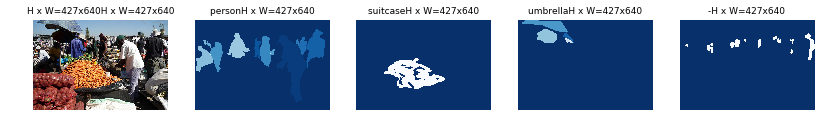

Image id:  1
Image meta [   1  640  480    3    0  128 1024  896    1    1    1    1    1    1    1    1    1    1    1
    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1
    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1
    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1
    1    1    1    1    1    1    1    1    1    1    1    1    1]


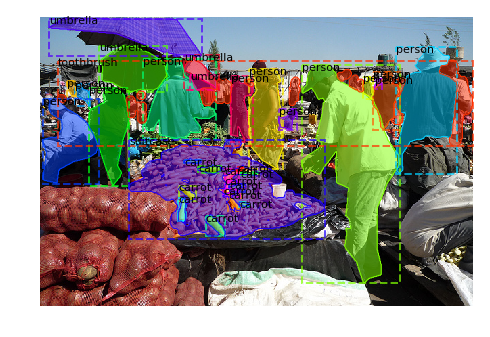

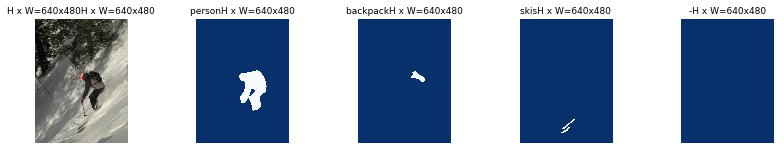

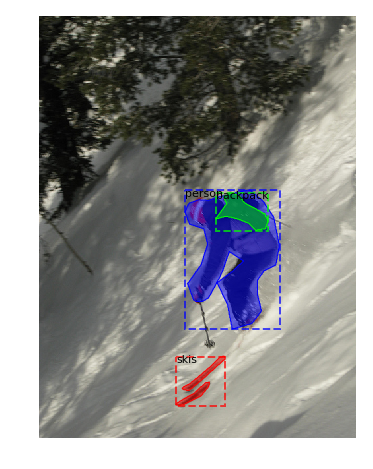

In [7]:
class_names = dataset_train.class_names
imgmeta_idx = mrcnn_model.keras_model.input_names.index('input_image_meta')
img_meta    = train_batch_x[imgmeta_idx]

for img_idx in range(mrcnn_config.BATCH_SIZE):
    image_id = img_meta[img_idx,0]
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    bbox = utils.extract_bboxes(mask)
    print('Image id: ',image_id)
    print('Image meta', img_meta[img_idx, :10])

    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)
    visualize.display_instances_with_mask(image, bbox, mask, class_ids, coco_class_names, figsize =(8,8))  

#### Load a specific image using image_id

In [ ]:
## 62642 (persons),   68539 (trucks) 36466 (surfers)  75040 (boat and persons)
## 36466 surfers. 5498 basketbal players, 27711,30531
## 5498 lots of motorcylces & persons - 
## Persons: #26026, #7719, 111864, 58240,  
## 89243: Person, bicylce and traiffic lights
## 35347 - laptops, keyboards and cat
## items = [59199 , 102868]
## 101623 (cake and forks), 41423 (elephant & people)
## 33477 Table, bowl, cup, sandwich, knife
## 26763 Table, chair, cup , bowl, bottle
## 49316 Table, book, backpack, many bottles
# train_batch_x, train_batch_y = next(train_generator)
# IMAGE_LIST = [75040] 
# IMAGE_LIST = [89243]
# IMAGE_LIST = [33477]
# IMAGE_LIST = [29731]
IMAGE_LIST = [26763]
train_batch_x, train_batch_y = test_batch_x, test_batch_y = data_gen_simulate(dataset_train, mrcnn_config, IMAGE_LIST)
imgmeta_idx = mrcnn_model.keras_model.input_names.index('input_image_meta')
img_meta    = train_batch_x[imgmeta_idx]

for img_idx in range(mrcnn_config.BATCH_SIZE):
    image_id = img_meta[img_idx,0]
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    bbox = utils.extract_bboxes(mask)
    class_names = [str(dataset_train.class_names[class_id]) for class_id in class_ids]
    print(' Dataset coco file:', dataset_train.image_info[image_id]['id'])
    print(' Image meta  : ', img_meta[img_idx,:10])
    print(' Classes     : ', class_ids)
    print(" Image_id    : ", image_id, ' Reference: ', dataset_train.image_reference(image_id))
    print(' Class_ids.shape[0]:', class_ids.shape[0], 'bbox.shape[0]:',bbox.shape[0])       
    print(' Class Names : ', class_names)
    
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)   
    # Display image and instances
    visualize.display_instances_with_mask(image, bbox, mask, class_ids, dataset_train.class_names, figsize =(8,8))    

## Pass image through MRCNN and FCN

###  Pass data thru MRCNN model - Load In/Out Data - Pass through FCN

In [8]:
mrcnn_model.layer_info()

# model_output = get_layer_output_2(model.keras_model, train_batch_x, 1)
model_output = get_layer_output_1(mrcnn_model.keras_model, train_batch_x, [0,1,2,3], 1)

### Load input / output data

print(len(model_output))
# del pred_heatmap_norm, pred_heatmap_scores, gt_heatmap, gt_heatmap_scores
model_pred_heatmap_norm         = model_output[0]          # layer:  0   shape: (1, 256, 256, 81)
model_pred_heatmap_scores       = model_output[1]          # layer:  1   shape: (1, 81, 200, 11)
model_gt_heatmap                = model_output[2]          # layer:  2   shape: (1, 256, 256, 81)
model_gt_heatmap_scores         = model_output[3]          # layer:  3   shape: (1, 81, 200, 11)

for i in model_output:
    print( i.shape)

# input_image      =  train_batch_x[0]
input_image_meta =  train_batch_x[1]
input_gt_bboxes  =  train_batch_x[5]
print(input_image_meta)



 Inputs:
 -------
 index:  0    input name : input_image:0                              Type: float32           Shape: (?, 1024, 1024, 3)
 index:  1    input name : input_image_meta:0                         Type: float32           Shape: (?, ?)
 index:  2    input name : input_rpn_match:0                          Type: int32             Shape: (?, ?, 1)
 index:  3    input name : input_rpn_bbox:0                           Type: float32           Shape: (?, ?, 4)
 index:  4    input name : input_gt_class_ids:0                       Type: int32             Shape: (?, ?)
 index:  5    input name : input_gt_boxes:0                           Type: float32           Shape: (?, ?, 4)


 Outputs:
 --------
 layer:  0    output name: cntxt_layer/pred_heatmap_norm:0            Type: float32           Shape: (2, 256, 256, 81)
 layer:  1    output name: cntxt_layer/pred_heatmap_scores:0          Type: float32           Shape: (2, 81, 200, 11)
 layer:  2    output name: cntxt_layer_gt/gt_heatmap

### Pass data through FCN

In [10]:
fcn_model.layer_info()



 Inputs:
 -------
 index:  0    input name : input_image_meta_1:0                       Type: float32           Shape: (?, ?)
 index:  1    input name : input_pr_hm_norm:0                         Type: float32           Shape: (?, 256, 256, 81)
 index:  2    input name : input_pr_hm_scores:0                       Type: float32           Shape: (?, 81, 200, 11)
 index:  3    input name : input_gt_hm_norm:0                         Type: float32           Shape: (?, 256, 256, 81)
 index:  4    input name : input_gt_hm_scores:0                       Type: float32           Shape: (?, 81, 200, 11)


 Outputs:
 --------
 layer:  0    output name: fcn8_heatmap/BiasAdd:0                     Type: float32           Shape: (?, ?, ?, 81)
 layer:  1    output name: fcn8_softmax/truediv:0                     Type: float32           Shape: (?, ?, ?, 81)
 layer:  2    output name: fcn_MSE_loss/fcn_MSE_loss:0                Type: float32           Shape: (1, 1)
 layer:  3    output name: fcn_CE_loss

In [11]:
fcn_train_batch_x = [train_batch_x[1]]
fcn_train_batch_x.extend(model_output[:4])
for i in fcn_train_batch_x:
    print(i.shape)
# fcn_train_batch_x = [model_pred_heatmap_norm, model_pred_heatmap_scores, model_gt_heatmap, model_gt_heatmap_scores]

fcn_model_output = get_layer_output_1(fcn_model.keras_model, fcn_train_batch_x, [0,1,2,3], 1)
 

model_fcn_heatmap               = fcn_model_output[0]          # layer:  0   shape: (1, 256, 256, 81)
model_fcn_softmax               = fcn_model_output[1]          # layer:  0   shape: (1, 256, 256, 81)
model_fcn_MSE_Loss              = fcn_model_output[2]          # layer:  1   shape: ()
model_fcn_CE_Loss               = fcn_model_output[3]          # layer:  1   shape: ()

# hm_sum = np.sum(model_fcn_heatmap, axis=(1,2))
print('FCN MSE loss: ',model_fcn_MSE_Loss)
print('FCN CE loss:  ',model_fcn_CE_Loss)

(2, 89)
(2, 256, 256, 81)
(2, 81, 200, 11)
(2, 256, 256, 81)
(2, 81, 200, 11)
/* Inputs */
Input  0:  (input_image_meta_1:0                    ) 	  Input shape: (2, 89)
Input  1:  (input_pr_hm_norm:0                      ) 	  Input shape: (2, 256, 256, 81)
Input  2:  (input_pr_hm_scores:0                    ) 	  Input shape: (2, 81, 200, 11)
Input  3:  (input_gt_hm_norm:0                      ) 	  Input shape: (2, 256, 256, 81)
Input  4:  (input_gt_hm_scores:0                    ) 	  Input shape: (2, 81, 200, 11)

/* Outputs */
Output idx:  0    Layer:  0: (fcn8_heatmap/BiasAdd:0                  ) 	  Output shape: (2, 256, 256, 81)
Output idx:  1    Layer:  1: (fcn8_softmax/truediv:0                  ) 	  Output shape: (2, 256, 256, 81)
Output idx:  2    Layer:  2: (fcn_MSE_loss/fcn_MSE_loss:0             ) 	  Output shape: (1, 1)
Output idx:  3    Layer:  3: (fcn_CE_loss/fcn_CE_loss:0               ) 	  Output shape: (1, 1)

Number of layers generated:  4 

BiasAdd                   

## Display Heatmaps

In [12]:
# from mrcnn.visualize import (plot_one_bbox_heatmap, 
#                              plot_3d_heatmap, plot_2d_heatmap, 
#                              plot_3d_heatmap_all_classes, plot_2d_heatmap_all_classes,
#                              plot_2d_heatmap_compare, plot_3d_heatmap_compare)
# import matplotlib as plt
# %matplotlib inline
print('Image id: ',image_id, ' Coco ID: ', dataset_train.image_info[image_id]['id'])
img_id = 0
coco_class_names = dataset_train.class_names
gt_class_ids = np.unique(model_gt_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
pr_class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
print('GT   class ids: ', gt_class_ids)
print('Pred class ids: ', pr_class_ids)

print(model_fcn_heatmap.shape)

Image id:  1  Coco ID:  262146
GT   class ids:  [0, 1, 26, 52]
Pred class ids:  [0, 1, 25, 26, 27, 29, 52, 57]
(2, 256, 256, 81)


### 2D Plots  

####  2D plot of `model_gt_heatmap` returned from model

(2, 256, 256, 81) (2, 81, 200, 11)
Image : 0  ClassIds: [0, 1, 26, 52]
Display classes: [0, 1, 26, 52]
rows   2  columns : 3
 min_z_all shape: ()  min_z_all: 0.0  max_z_all: () max_z_all: 1.0
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == all


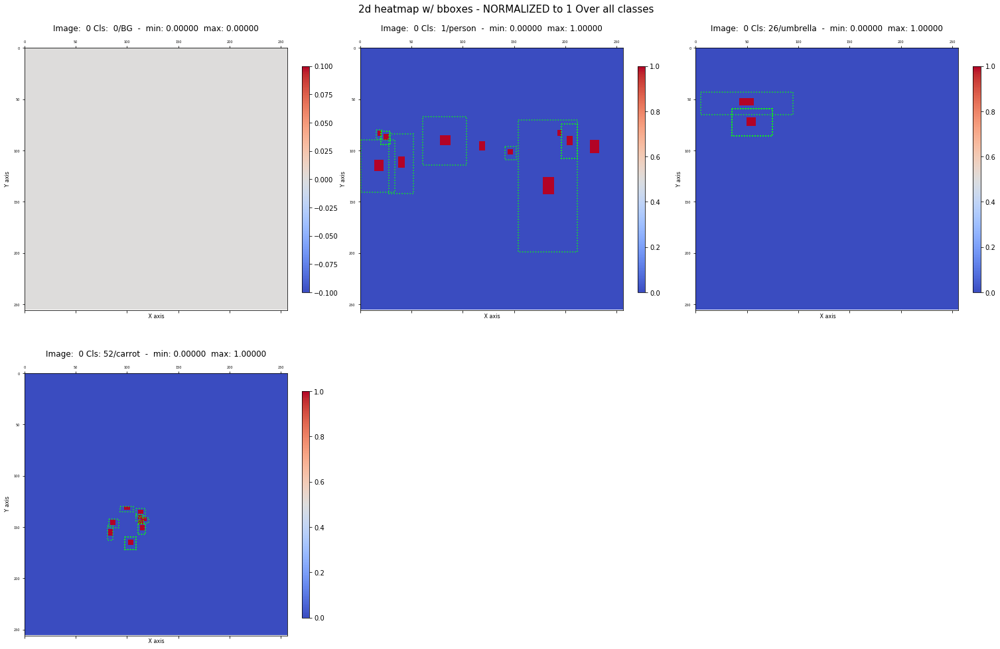

In [13]:
for img_id in [0]:     ##range(mrcnn_config.BATCH_SIZE):
    print(model_gt_heatmap.shape, model_gt_heatmap_scores.shape)
    class_ids = np.unique(model_gt_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
    plot_2d_heatmap(model_gt_heatmap, model_gt_heatmap_scores, img_id, class_ids, 
                     class_names = coco_class_names, columns = 3, scale = 4, scaling = 'all')    

####  2D plot of `model_fcn_heatmap` and `model_fcn_softmax` returned from model (with Ground Truth Bounding Boxes)

(2, 256, 256, 81)
Image : 0  GT ClassIds: [0, 1, 26, 52]
Display classes: [0, 1, 26, 52]
rows   1  columns : 4
 min_z_all shape: ()  min_z_all: -0.09603197  max_z_all: () max_z_all: 1.1568816
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == all


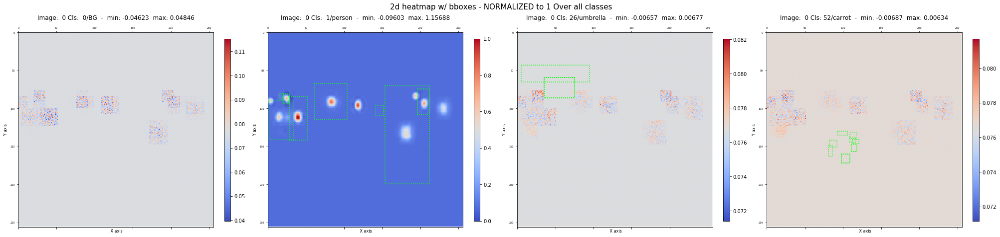

Display classes: [0, 1, 26, 52]
rows   1  columns : 4
 min_z_all shape: ()  min_z_all: 0.011230597  max_z_all: () max_z_all: 0.038218908
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == all


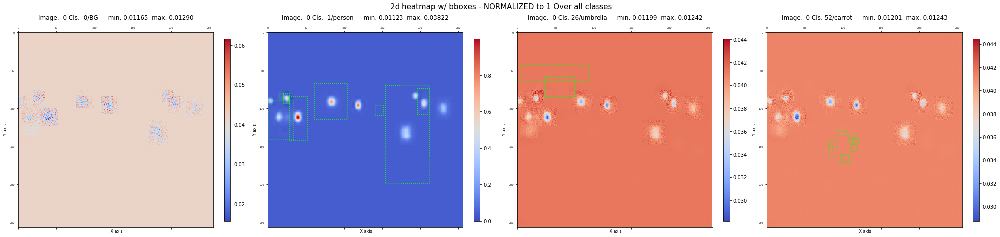

In [18]:
for img_id in [0]:     ##range(mrcnn_config.BATCH_SIZE):
    print(model_fcn_heatmap.shape)
    
    print('Image : {}  GT ClassIds: {}'.format(img_id,  gt_class_ids))
    plot_2d_heatmap(model_fcn_heatmap, model_gt_heatmap_scores,img_id, gt_class_ids, columns = 4,
                                 class_names = coco_class_names, scale = 4, scaling = 'all')
    plot_2d_heatmap(model_fcn_softmax, model_gt_heatmap_scores,img_id, gt_class_ids, columns = 4,
                                 class_names = coco_class_names, scale = 4, scaling = 'all')
        

####  2D plot of `model_fcn_heatmap` returned from model (with MRCNN PREDICTED Bounding Boxes)

(2, 256, 256, 81)
Image : 0  ClassIds: [0, 1, 25, 26, 27, 29, 52, 57]
Display classes: [0, 1, 25, 26, 27, 29, 52, 57]
rows   2  columns : 4
 min_z_all shape: ()  min_z_all: -0.09603197  max_z_all: () max_z_all: 1.1568816
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == all


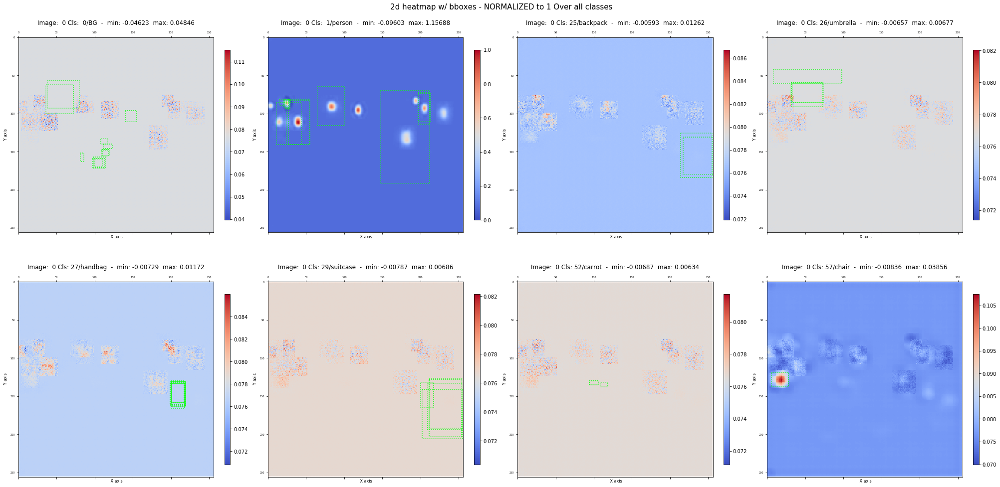

Display classes: [0, 1, 25, 26, 27, 29, 52, 57]
rows   2  columns : 4
 min_z_all shape: ()  min_z_all: 0.011230597  max_z_all: () max_z_all: 0.038218908
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == all


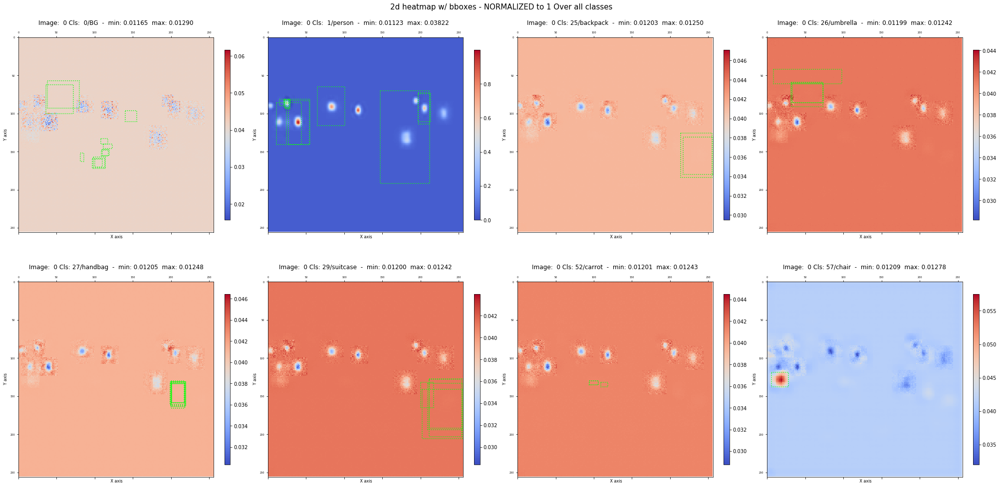

In [19]:
for img_id in [0]:     ##range(mrcnn_config.BATCH_SIZE):
    print(model_fcn_heatmap.shape)
    print('Image : {}  ClassIds: {}'.format(img_id, pr_class_ids))
    plot_2d_heatmap(model_fcn_heatmap, model_pred_heatmap_scores,img_id, class_ids, columns = 4,
                                 class_names = coco_class_names, scale = 4, scaling = 'all')
    plot_2d_heatmap(model_fcn_softmax, model_pred_heatmap_scores,img_id, class_ids, columns = 4,
                                 class_names = coco_class_names, scale = 4, scaling = 'all')

####  2D plot of `model_fcn_heatmap` returned from model - ALL CLASSES

Image : 0  Pred ClassIds: [0, 1, 25, 26, 27, 29, 52, 57]
            Gt   ClassIds: [0, 1, 26, 52]
Display all classes...
rows   21  columns : 4
 min_z_all shape: ()  min_z_all: -0.09603197  max_z_all: () max_z_all: 1.1568816
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == all


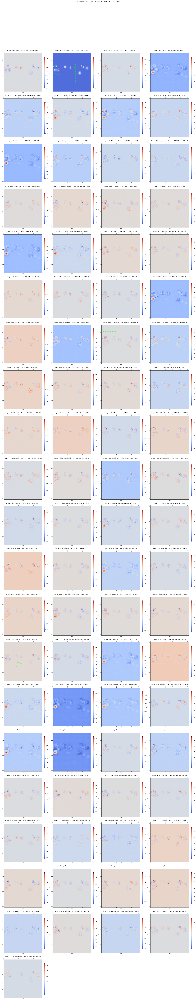

In [20]:
for img_id in [0]: ##range(mrcnn_config.BATCH_SIZE):
    class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    print('Image : {}  Pred ClassIds: {}'.format(img_id, pr_class_ids))
    print('            Gt   ClassIds: {}'.format(gt_class_ids))
#     plot_2d_heatmap_with_bboxes(model_fcn_heatmap[...,:class_ids[-1]+1], model_gt_heatmap_scores, img_id, 
#                                 class_ids, class_names = class_names, columns = 2, scale = 4)
    fig = plot_2d_heatmap(model_fcn_heatmap, model_gt_heatmap_scores, img_id,
                                class_names = coco_class_names, columns = 4, scale = 4, scaling = 'all')
#     fig.savefig('fcn_heatmaps_2d.png')

In [ ]:
fig.savefig('fcn_heatmaps_2d.png')

####  2D plot of `pred_heatmap_norm` returned from MRCNN 

In [ ]:
for img_id in [0]: ## range(mrcnn_config.BATCH_SIZE):
    # print(pred_refined_heatmap_scores[img_id,:4])
    print(model_pred_heatmap_norm.shape)
    class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
    plot_2d_heatmap(model_pred_heatmap_norm, model_pred_heatmap_scores, img_id, class_ids, 
                                class_names = coco_class_names, size = (7,7), scale = 4, scaling='none')    

####  2D comparative display `pred_heatmap` / `fcn_heatmap`  

In [ ]:
for img_id in [0]: ##range(mrcnn_config.BATCH_SIZE):
    class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
#     class_ids = list(range(30))
    plot_2d_heatmap_compare(model_pred_heatmap_norm, model_fcn_heatmap, model_pred_heatmap_scores, img_id, 
                            class_ids = class_ids, class_names = coco_class_names, scale = 4, scaling = True )      

### Overlay predictions on image

#### Overlay image with gt_heatmaps

(2, 81, 200, 11)
class ids:  [0, 1, 26, 52]
Image shape : (1024, 1024, 3)  class_ids: [ 0  1 26 52]
heatmaps shape: (256, 256, 81) bboxes shape : (81, 200, 4)
1- image    :  (1024, 1024, 3) float32 -123.7 151.1
2- image    :  (1024, 1024, 3) uint8 0 255


D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\util\dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


5 -  unresize_image(): shape after  resize: (427, 640, 3)  datatype uint8 
     min: 0 , max: 255 
3- image    :  (427, 640, 3) uint8 0 255
5- image_bw:  (427, 640) uint8 0 254


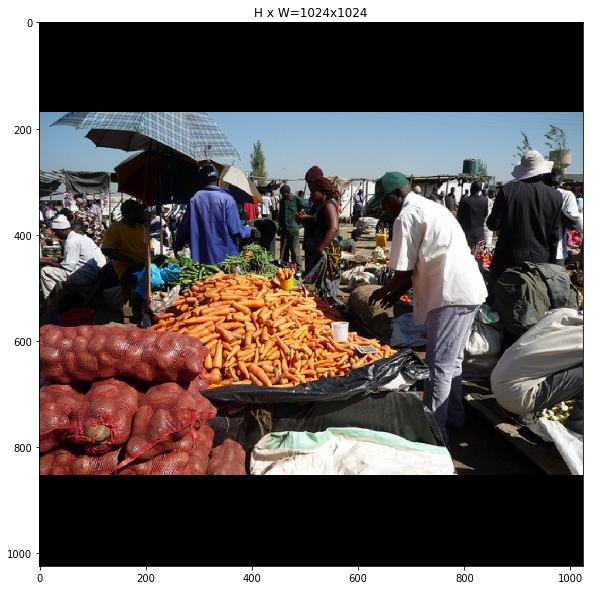

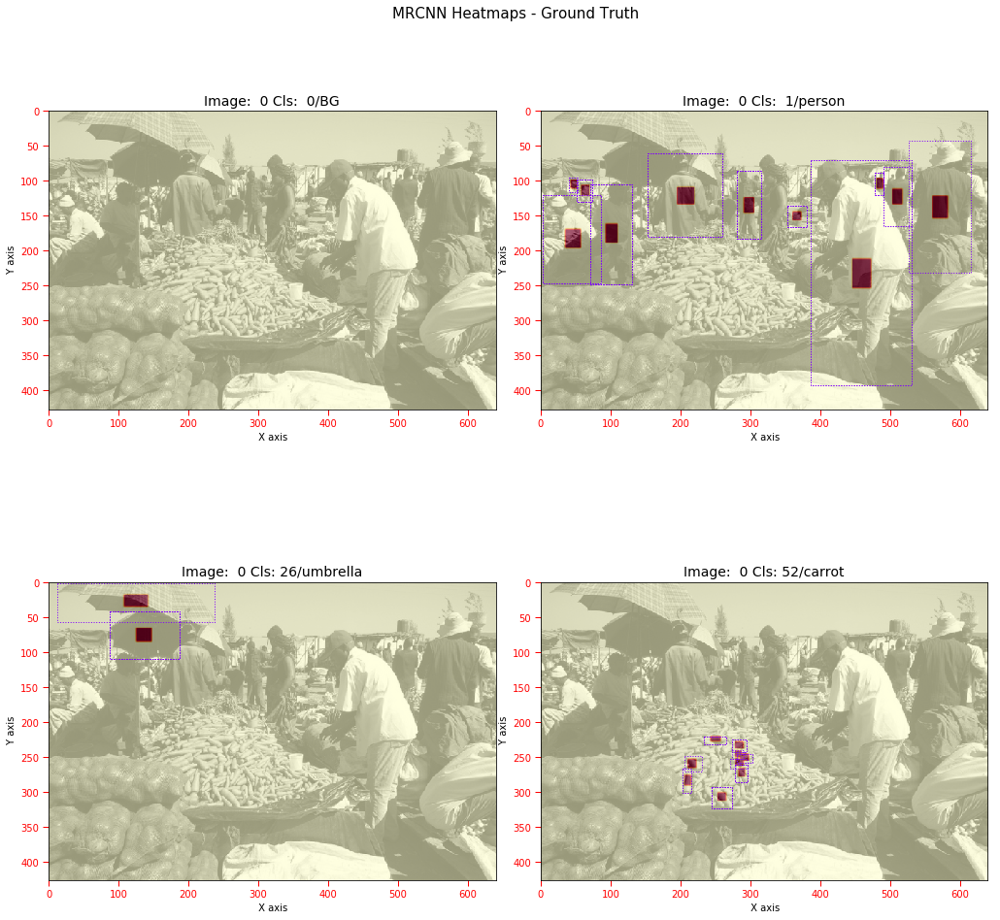

In [21]:
from mrcnn.visualize import display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn
# visualize.display_image_bw(image)
print(model_gt_heatmap_scores.shape)
class_ids = np.unique(model_gt_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
print('class ids: ', class_ids)
display_heatmaps_mrcnn(train_batch_x, model_output, 0, hm = 'gt',
                     config = mrcnn_config, class_ids = class_ids, class_names = coco_class_names)

#### Overlay image with pred_heatmaps

(2, 81, 200, 11)
GT   class ids:  [0, 1, 26, 52]
Pred class ids:  [0, 1, 25, 26, 27, 29, 52, 57]
Image shape : (1024, 1024, 3)  class_ids: [ 0  1 25 26 27 29 52 57]
heatmaps shape: (256, 256, 81) bboxes shape : (81, 200, 4)
1- image    :  (1024, 1024, 3) float32 -123.7 151.1
2- image    :  (1024, 1024, 3) uint8 0 255


D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\util\dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


5 -  unresize_image(): shape after  resize: (427, 640, 3)  datatype uint8 
     min: 0 , max: 255 
3- image    :  (427, 640, 3) uint8 0 255
5- image_bw:  (427, 640) uint8 0 254


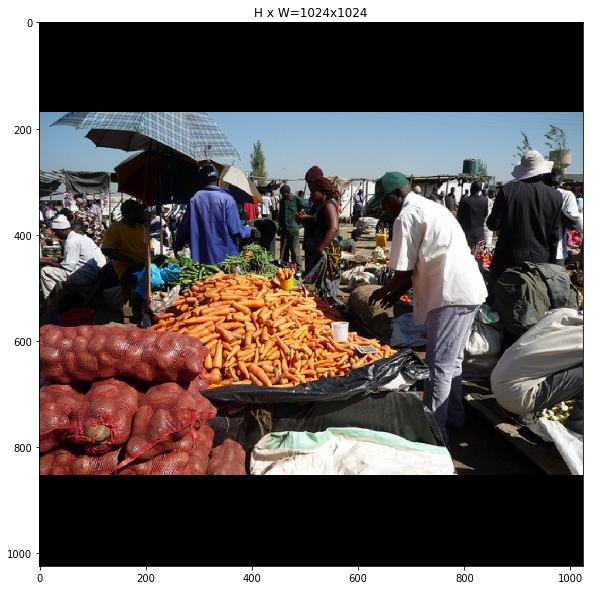

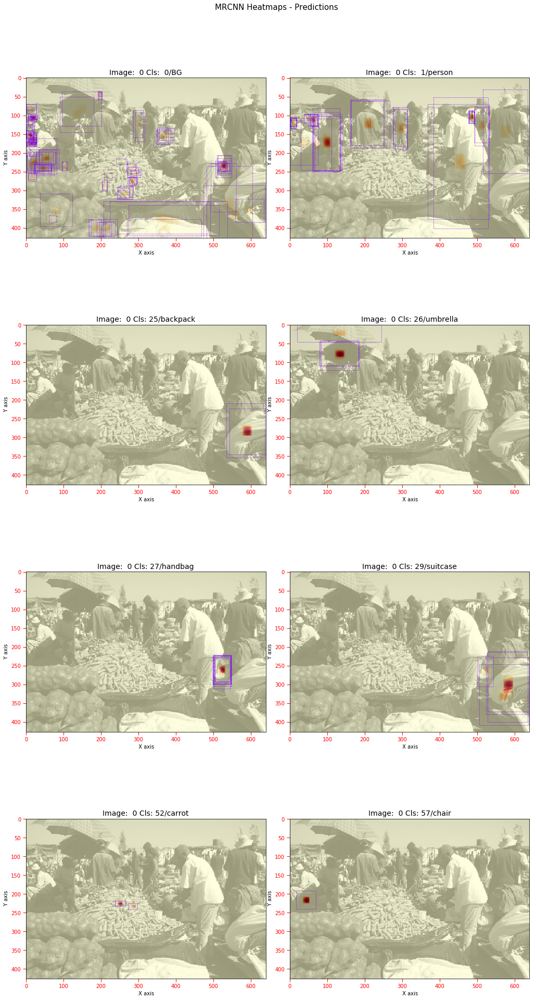

In [22]:
from mrcnn.visualize import display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn
# visualize.display_image_bw(image)
print(model_gt_heatmap_scores.shape)
gt_class_ids = np.unique(model_gt_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
pr_class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()

print('GT   class ids: ', gt_class_ids)
print('Pred class ids: ', pr_class_ids)
display_heatmaps_mrcnn(train_batch_x, model_output, 0, hm = 'pr',  
                     config = mrcnn_config, class_ids = pr_class_ids, class_names = coco_class_names)

#### Overlay image with fcn_heatmaps

GT   class ids:  [0, 1, 26, 52]
Pred class ids:  [0, 1, 25, 26, 27, 29, 52, 57]
 Bounding boxes shape:  (81, 200, 11)
Image shape : (1024, 1024, 3)  class_ids: [0, 1, 25, 26, 27, 29, 52, 57]
1- image    :  (1024, 1024, 3) float32 -123.7 151.1
2- image    :  (1024, 1024, 3) uint8 0 255


D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\util\dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


5 -  unresize_image(): shape after  resize: (427, 640, 3)  datatype uint8 
     min: 0 , max: 255 
3- image    :  (427, 640, 3) uint8 0 255
4- image_bw:  (427, 640) uint8 0 254
 min_z_all:  () -0.09603197  max_z_all : () 1.1568816
 min_z_cls:  (1, 1, 81)  max_z_cls : (1, 1, 81)
 SCALING == class
 Title:  Img: 0 Cls:  0/BG  -  min: 0.00000  max: 1.00000
 Title:  Img: 0 Cls:  1/person  -  min: 0.00000  max: 1.00000
 Title:  Img: 0 Cls: 25/backpack  -  min: 0.00000  max: 1.00000
 Title:  Img: 0 Cls: 26/umbrella  -  min: 0.00000  max: 1.00000
 Title:  Img: 0 Cls: 27/handbag  -  min: 0.00000  max: 1.00000
 Title:  Img: 0 Cls: 29/suitcase  -  min: 0.00000  max: 1.00000
 Title:  Img: 0 Cls: 52/carrot  -  min: 0.00000  max: 1.00000
 Title:  Img: 0 Cls: 57/chair  -  min: 0.00000  max: 1.00000


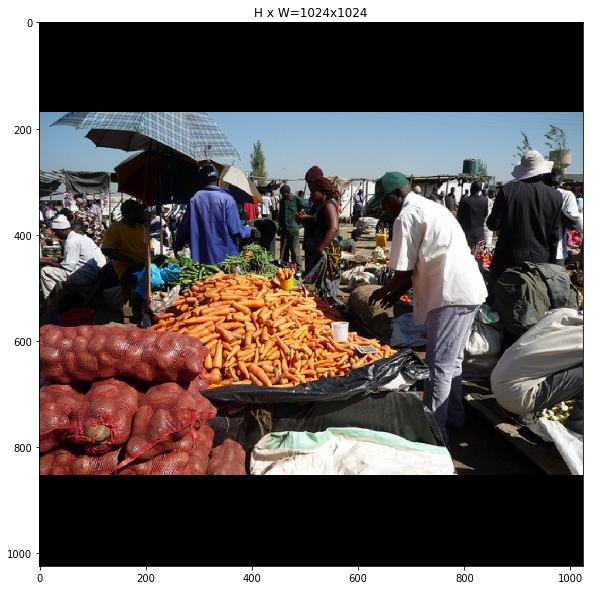

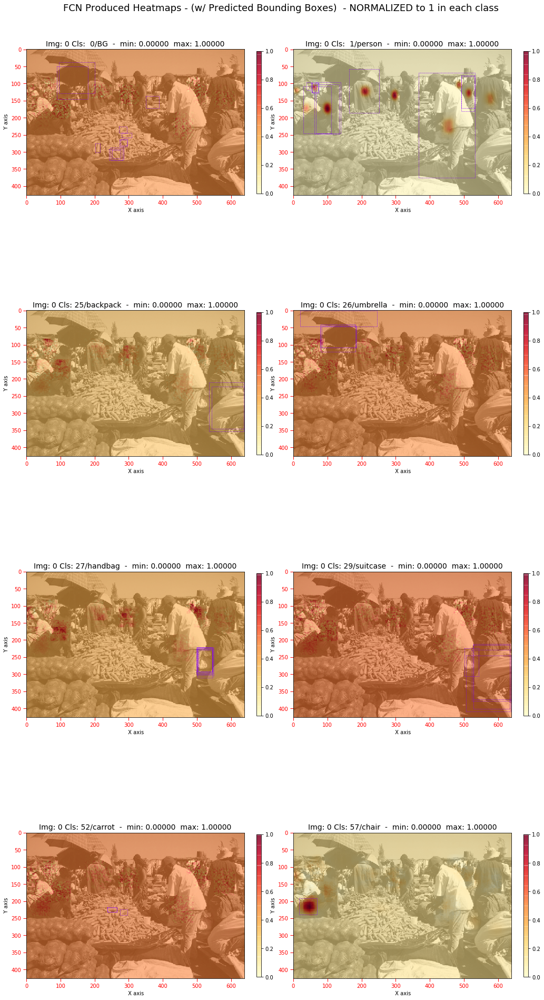

In [24]:
from mrcnn.visualize import display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn_fcn
# visualize.display_image_bw(image)
print('GT   class ids: ', gt_class_ids)
print('Pred class ids: ', pr_class_ids)
display_heatmaps_mrcnn_fcn(train_batch_x, fcn_train_batch_x, 0, heatmap = model_fcn_heatmap, hm = 'pr',  
                     config = mrcnn_config, class_ids = pr_class_ids , class_names = coco_class_names, scaling = 'class')

###  3D Plots

####  3D plot of  `gt_heatmap_norm` returned form code above

In [ ]:
for img_id in [0]: ## range(mrcnn_config.BATCH_SIZE):
    print(model_gt_heatmap.shape)
    class_ids = np.unique(model_gt_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
    plot_3d_heatmap(model_gt_heatmap, img_id, class_ids, class_names = coco_class_names, zlim = 'all')
    

####  3D plot of `pred_heatmap_norm` returned form model

In [ ]:
for img_id in [0]: ##range(mrcnn_config.BATCH_SIZE):
    print(model_pred_heatmap_norm.shape)
    class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
    plot_3d_heatmap(model_pred_heatmap_norm, img_id, class_ids, class_names = coco_class_names, zlim = 'all' )
    

####  3D plot of `fcn_heatmap` returned form model - only classes in pred_scores

In [ ]:
print(np.max(model_fcn_heatmap), np.min(model_fcn_heatmap))

In [ ]:
# for img_id in [0]: ##range(mrcnn_config.BATCH_SIZE):
#     print(model_fcn_heatmap.shape)
#     class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
#     print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
#     plot_3d_heatmap(model_fcn_heatmap, img_id, class_ids,class_names = coco_class_names, scaling = False)
    
for img_id in [0]: ##range(mrcnn_config.BATCH_SIZE):
    print(model_fcn_heatmap.shape)
    class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
    plot_3d_heatmap(model_fcn_heatmap, img_id, class_ids,class_names = coco_class_names, zlim = 'one',scaling = False)
    

####  3D plot of `fcn_softmax` returned form model - only classes in pred_scores

In [ ]:
for img_id in [0]: ##range(mrcnn_config.BATCH_SIZE):
    print(model_fcn_heatmap.shape)
    class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
    plot_3d_heatmap(model_fcn_softmax, img_id, class_ids,class_names = coco_class_names, scaling = False)

####  3D plot of `fcn_heatmap` returned form model - all classes

In [ ]:
for img_id in [0]: ##range(mrcnn_config.BATCH_SIZE):
    class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
#     plot_3d_heatmap(model_fcn_heatmap, img_id, class_ids,class_names = class_names, size = (8,8), zlim=0)
#     plot_3d_heatmap_all_classes(model_fcn_heatmap[...,:class_ids[-1]+1], img_id, class_names = class_names, size = (8,8), zlim=0.0)
    plot_3d_heatmap(model_fcn_heatmap, img_id, class_names = class_names, columns = 2,scaling = True)

####  3D comparative display `pred_heatmap` / `fcn_heatmap` 

In [ ]:
for img_id in [0]: ##range(mrcnn_config.BATCH_SIZE):
    print(model_pred_heatmap_norm.shape)
    class_ids = np.unique(model_pred_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
    class_ids.append(1)
    class_ids = list(range(30))
#     print(class_ids)
    plot_3d_heatmap_compare(model_pred_heatmap_norm,model_fcn_heatmap, img_id, class_ids = class_ids, 
                            class_names = class_names, size=(8,8), zlim = 'all' , scaling = True)

####  3D comparative display `gt_heatmap` / `fcn_heatmap` 

In [ ]:
for img_id in [0]: ##range(mrcnn_config.BATCH_SIZE):
    class_ids = np.unique(model_gt_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
    class_ids.extend([1,2])
    print(class_ids)
    print(type(class_ids))
    class_ids.sort()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
    plot_3d_heatmap_compare(model_gt_heatmap,model_fcn_heatmap, img_id, class_ids, class_names = class_names, size=(8,8), zlim = 0 )

### Overlay predictions on image

#### Overlay image with gt_heatmaps

In [ ]:
from mrcnn.visualize import display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn
# visualize.display_image_bw(image)
print(model_gt_heatmap_scores.shape)
class_ids = np.unique(model_gt_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
print('class ids: ', class_ids)
display_heatmaps_mrcnn(train_batch_x, model_output, 0, hm = 'gt',
                     config = mrcnn_config, class_ids = class_ids, class_names = coco_class_names)

#### Overlay image with pred_heatmaps

In [ ]:
from mrcnn.visualize import display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn
# visualize.display_image_bw(image)
print(model_gt_heatmap_scores.shape)
class_ids = np.unique(model_gt_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
print('class ids: ', class_ids)
display_heatmaps_mrcnn(train_batch_x, model_output, 0, hm = 'pr', num_bboxes = 0,
                     config = mrcnn_config, class_ids = class_ids, class_names = coco_class_names)

#### Overlay image with fcn_heatmaps

In [ ]:
from mrcnn.visualize import display_heatmaps, display_heatmaps_mrcnn_fcn
# visualize.display_image_bw(image)
class_ids = np.unique(model_gt_heatmap_scores[img_id,:,:,4]).astype(int).tolist()
print(class_ids)
display_heatmaps_mrcnn_fcn(train_batch_x, fcn_train_batch_x, 0, heatmap = model_fcn_heatmap, hm = 'gt', columns = 3,
                     config = mrcnn_config, class_ids = class_ids, class_names = coco_class_names, scaling = True)
display_heatmaps_mrcnn_fcn(train_batch_x, fcn_train_batch_x, 0, heatmap = model_fcn_softmax, hm = 'gt', columns = 3,
                     config = mrcnn_config, class_ids = class_ids, class_names = coco_class_names, scaling = True)